# Methushelah's genes

Here, we will create a genetic algorthm to find great Methushelahs in Conway's Game of Life

First, we will decide the representation of the chromosomes.
Life consists of two optional states for each cell: Alive (1) and Dead (0),
which immediately cause us to think of binary representation for the grid f cells.
One approach will be to create a matrix of fixed size with the cells in binary representation.

In [1]:
import numpy as np
import random
#density - probability of each cell to be alive
Pd = [1./3,2./3]

#-----------------------------------------------
#here we will create the objects for chromosomes
class chromosome:
    def __init__(self,size):
        self.matrix = np.random.choice([1, 0], size=size, p=Pd)
        self.fitness = 0

    
    

In [2]:
#here we will have the function to create population
class population:
    def __init__(self,pop_size,chromo_size):
        self.members = [chromosome(chromo_size) for i in range(pop_size)]
    
    

The genetic operators we will have will be the _reproduction_ operator and the _mutation_ operator.

When _reproducing,_ two individuals from the population are chosen and are cut in a random point of the matrix to create an offspring of the pattern to this index of one parent combined with the rest from the other parent.

_Mutation_ will be defined as a single binary change in the initial configuration  

In [3]:
import random

#probability of mutaion:
Pm = 0.05
#probability of reproduction:
Pr = 1

#-----------------------------------------------

class population(population):
    def reproduction(self,parent1,parent2): #maybe move the selection inside this function
        if random.random() > Pr:
            return random.choice([parent1,parent2])

        size = parent1.matrix.shape
        if parent2.matrix.shape != size:
            raise ValueError('Parents shapes do not match.')
            
        offspring = chromosome(size)
        x,y = size

        #for easy slicing
        parent1.matrix.shape = (x*y)
        parent2.matrix.shape = (x*y)

        brk_pnt = np.random.choice(range(x*y))
        offspring.matrix = np.concatenate([parent1.matrix[:brk_pnt],parent2.matrix[brk_pnt:]])
        offspring.matrix.shape = size
        #are the 2 following necessary?
        parent1.matrix.shape = size
        parent2.matrix.shape = size
        
        self.add(random.choice([parent1,parent2]))
        return offspring

class chromosome(chromosome):
    def mutation(self):
        x,y = size = self.matrix.shape
        self.matrix.shape = (x*y)
        for i in range(x*y):
            if random.random() <= Pm:
                self.matrix[i] = 1-self.matrix[i]
        self.matrix.shape = size


In order to reproduce, we first need to _select_ the lucky parents!
We will use the roulette wheel selection for this.

In [4]:
class population(population):
    def select(self):
        total_fitness = sum([c.fitness for c in self.members])
        wheel_location = random.random() * total_fitness
        i = 0
        current_sum = self.members[i].fitness
        #print("cur_sum: ",current_sum)

        while ((current_sum < wheel_location) and (i < len(self.members))):
            i += 1
            current_sum += self.members[i].fitness
        selected = self.members[i]
        self.extract(selected)
        return selected

    def extract(self,chromo):
        self.members = [c for c in self.members if c!= chromo]
    
    def add(self,chromo):
        self.members += [chromo]



#### In order to select, we need to calculate the fitness of a chromosome.
This is the tricky part.

We want to give higher scores to configurations that are Methus, or close to ones.

Being a Methu is determined by the periodicity of the pattern at the end of the running.

For that, we will have to implement Life, run the configuration for a certain number of generations, and determine whether at some point the pattern repeats itself.

I have decided to run Life with a library called Seagull, only for simulating Life easily.

To determine periodicity we simply need to find a pattern that is identical to a pattern that was already shown,

That way, due to the determinism of CA, we will always get the same configurations following the identical patterns, meaning we've found periodicity.

So, when finding such a couple, we can say we have reached the lifespan (L) of the configuration.

For fitness I have decided to combine two tests:
 - the Lifespan of a configuration (L/I)
 - the peak population it had reached (P/I)
 
#### So the _fitness_ is the sum: L/I + P/I
The higher, the better.

In [5]:
from datetime import datetime
import pandas as pd


def clean(history):
    new_history = []
    for data in history:
        data = data[~np.all(data == 0, axis=1)]
        data = np.delete(data,np.where(~data.any(axis=0))[0], axis=1)
        new_history += [data]

    return new_history

In [27]:
# Some settings to show a JS animation
import matplotlib.pyplot as plt
from datetime import datetime

plt.rcParams["animation.html"] = "jshtml"

import seagull as sg
from seagull.lifeforms import Custom

ltc = 5
#size of the board
Sb = (300,300)
#number of iterations
In = 4000

#-----------------------------------------------

class chromosome(chromosome):
    def cal_fitness(self, isAnim=False):
        start_event = (datetime.now())

        x,y = Sb
        xc,yc = self.matrix.shape
        
        board = sg.Board(size=(Sb))
        board.add(Custom(self.matrix), loc=(x//2-xc//2,y//2-yc//2))
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=In)
        history = sim.get_history().astype(int)
        history = clean(history)
        g = 0
        lifespan = 0
        found = False

        for gen in history:
            if g == 0:
                g+=1
                continue

            ite = history[g-1:g-ltc:-1] if g > ltc else history[g-1::-1]
            for prev in ite:
                comp = gen == prev
                if type(comp) != bool: #if it's bool, then sizes don't match and datas not same.
                    if comp.all():
                        lifespan = g
                        found = True
                        break
            if found:
                break
            g+=1
        self.matrix.shape = (xc*yc)
        self.I = I = sum(self.matrix)
        self.matrix.shape = (xc,yc)
        self.L = L = lifespan
#         history[L].shape = (x*y)
#         F = sum(history[L])
#         history[L].shape = (x,y)
        self.P = P = stats["peak_cell_coverage"] * x*y #that's the pop size at its highest
        
        self.fitness = L/I + P/I if (L > 0) else 0
        if L == 0 and self.fitness != 0:
            print("problem")
        end_event = (datetime.now())
        self.cal_time = end_event-start_event
        self.cal_time = self.cal_time.seconds+self.cal_time.microseconds/1000000
        if isAnim:
            sim.animate()


### Now, we can run the evolution algorithm itself!

In [7]:
import copy

even = False
pop_size = 10
chromo_size = (6,6)
pop = population(pop_size,chromo_size)
fit_rise = []
fit_max_rise = []
maxes_config = []
for c in pop.members:
    c.cal_fitness()

old_fit_avg = sum([c.fitness for c in pop.members])/len(pop.members)
old_fit_max = max([c.fitness for c in pop.members])
avg_time = sum([c.cal_time for c in pop.members])/len(pop.members)
print(avg_time)
print("old pop: ",[c.fitness for c in pop.members])
print("avg: ",old_fit_avg)
fit_rise += [old_fit_avg]
fit_max_rise += [old_fit_max]
for c in pop.members:
    if c.fitness == old_fit_max:
        maxes_config += [copy.deepcopy(c)]
        break
    
for p in range(100):
    print("generation: ",p+1)
    print("-------------------")
    
    new_pop = population(0,0)
    m = 0
    for c in pop.members:
        if c.fitness > m:
            m = c.fitness
            mc = c
    new_pop.add(mc)
#     mmc = copy.deepcopy(mc)
#     mmc.mutation()
#     new_pop.add(mmc)
    while len(pop.members) >= 2 :
        p1 = pop.select()
        p2 = pop.select()
        os = pop.reproduction(p1,p2)
        if os: 
            os.mutation()
            if len(new_pop.members) < pop_size:
                new_pop.add(os)
    if len(pop.members) > 0 and len(new_pop.members) < pop_size:
        for os in pop.members:
            new_pop.add(os)
    for c in new_pop.members:
        c.cal_fitness()

    fit_avg = sum([c.fitness for c in new_pop.members])/len(new_pop.members)
    fit_max = max([c.fitness for c in new_pop.members])
    print("new pop: ",[c.fitness for c in new_pop.members])
    print("avg: ",fit_avg)
    print("max: ",fit_max)
    fit_rise += [fit_avg]
    fit_max_rise += [fit_max]
    avg_time = sum([c.cal_time for c in new_pop.members])/len(new_pop.members)
    print(avg_time)
    for c in new_pop.members:
        if c.fitness == fit_max:
            maxes_config += [copy.deepcopy(c)]
            break
    if fit_rise[-1] == fit_rise[-2]:
        even = True
        break
    
    
    pop = new_pop


2021-12-23 02:56:05.776 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
C:\Users\mimis\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
2021-12-23 02:56:41.652 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:57:14.589 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:57:44.364 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
C:\Users\mimis\Anaconda3\lib\site-packages\seagull\utils\statistics.py:23: RuntimeWarning: divide by zero encountered in log2
  return -np.sum(np.log2([zero_probs, one_probs]))
2021-12-23 02:58:14.922 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:58:44.729 | INFO     | seagull.simulator:compute_statistics:128 - Computin

31.065584200000007
old pop:  [15.214285714285715, 12.0, 2.3636363636363633, 1.7142857142857144, 25.46153846153846, 15.25, 2.076923076923077, 1.9166666666666665, 58.61538461538461, 6.416666666666667]
avg:  14.10293872793873
generation:  1
-------------------


2021-12-23 03:01:15.031 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:01:45.653 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:02:14.566 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:02:43.542 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:03:12.974 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:03:42.317 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:04:11.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:04:41.743 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:05:12.133 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [58.61538461538461, 6.833333333333334, 1.8571428571428572, 14.545454545454547, 1.5384615384615383, 20.285714285714285, 1.2, 1.4166666666666667, 3.8461538461538463, 16.647058823529413]
avg:  12.678537051184112
max:  58.61538461538461
29.689555300000002
generation:  2
-------------------


2021-12-23 03:06:12.713 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:06:42.320 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:07:12.404 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:07:42.564 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:08:19.880 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:08:51.111 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:09:21.898 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:09:52.063 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:10:22.689 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [58.61538461538461, 58.61538461538461, 25.214285714285715, 22.470588235294116, 1.75, 34.272727272727266, 1.8461538461538463, 78.60000000000001, 17.714285714285715, 1.6428571428571428]
avg:  30.074166715637308
max:  78.60000000000001
30.9132734
generation:  3
-------------------


2021-12-23 03:11:22.902 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:11:52.590 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:12:22.154 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:12:51.921 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:13:22.405 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:13:51.620 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:14:20.800 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:14:50.050 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:15:20.264 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [78.60000000000001, 22.764705882352942, 5.428571428571429, 1.8333333333333333, 2.0, 15.53846153846154, 25.214285714285715, 1.941176470588235, 14.933333333333334, 4.529411764705883]
avg:  17.278327946563245
max:  78.60000000000001
29.6190701
generation:  4
-------------------


2021-12-23 03:16:20.082 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:16:50.412 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:17:20.828 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:17:50.401 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:18:20.431 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:18:50.002 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:19:21.169 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:19:51.699 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:20:27.562 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [78.60000000000001, 7.052631578947368, 1.7333333333333334, 3.6923076923076925, 4.285714285714286, 100.9375, 2.909090909090909, 2.25, 2.588235294117647, 24.285714285714285]
avg:  22.833452737922553
max:  100.9375
30.988397599999995
generation:  5
-------------------


2021-12-23 03:21:30.698 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:22:01.527 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:22:30.676 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:23:00.454 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:23:30.421 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:24:04.072 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:24:34.564 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:25:03.913 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:25:33.416 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [100.9375, 7.5, 2.153846153846154, 5.846153846153847, 4.705882352941177, 5.0588235294117645, 2.4210526315789473, 12.076923076923077, 7.1764705882352935, 2.1176470588235294]
avg:  14.999429923791379
max:  100.9375
30.2834406
generation:  6
-------------------


2021-12-23 03:26:34.105 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:27:04.654 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:27:34.314 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:28:03.811 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:28:33.070 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:29:02.839 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:29:32.413 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:30:01.468 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:30:30.633 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [100.9375, 107.06666666666666, 4.705882352941177, 20.88235294117647, 1.8125000000000002, 3.307692307692308, 45.53846153846153, 14.076923076923077, 8.473684210526315, 31.53846153846154]
avg:  33.83401246328491
max:  107.06666666666666
29.571531699999998
generation:  7
-------------------


2021-12-23 03:31:29.772 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:31:59.285 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:32:28.039 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:32:57.918 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:33:27.444 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:33:56.169 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:34:26.044 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:34:55.928 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:35:24.974 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [107.06666666666666, 2.5, 1.7058823529411766, 45.73333333333333, 1.5833333333333335, 117.78571428571429, 5.0, 1.7333333333333334, 1.714285714285714, 4.705882352941177]
avg:  28.952843137254906
max:  117.78571428571429
29.2832757
generation:  8
-------------------


2021-12-23 03:36:23.549 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:36:52.698 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:37:21.798 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:37:50.724 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:38:19.845 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:38:49.326 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:39:19.248 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:39:48.960 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:40:17.714 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [117.78571428571429, 9.4375, 2.5882352941176467, 10.466666666666667, 107.06666666666666, 28.5, 42.23076923076923, 1.55, 1.7333333333333334, 4.45]
avg:  32.580888547726786
max:  117.78571428571429
29.2115672
generation:  9
-------------------


2021-12-23 03:41:16.425 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:41:46.574 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:42:15.719 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:42:44.653 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:43:14.075 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:43:42.888 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:44:11.701 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:44:40.366 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:45:08.795 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [117.78571428571429, 16.428571428571427, 1.5, 12.0, 30.42105263157895, 2.5882352941176467, 3.2857142857142856, 2.1333333333333333, 3.1764705882352944, 2.611111111111111]
avg:  19.193020295837634
max:  117.78571428571429
29.035291100000002
generation:  10
-------------------


2021-12-23 03:46:07.484 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:46:37.703 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:47:06.302 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:47:35.218 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:48:04.127 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:48:33.189 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:49:02.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:49:39.239 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:50:19.306 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [117.78571428571429, 2.533333333333333, 3.0625, 8.352941176470587, 4.2, 22.294117647058822, 185.57142857142858, 5.375, 12.92857142857143, 1.875]
avg:  36.397860644257705
max:  185.57142857142858
31.116366999999997
generation:  11
-------------------


2021-12-23 03:51:18.928 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:51:48.862 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:52:17.801 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:52:46.834 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:53:15.585 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:53:45.262 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:54:14.158 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:54:43.266 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:55:12.159 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [185.57142857142858, 3.8125, 2.2777777777777777, 1.8235294117647056, 5.2105263157894735, 2.444444444444444, 78.13333333333334, 2.5, 2.9411764705882355, 31.0]
avg:  31.571471632512658
max:  185.57142857142858
29.112537399999997
generation:  12
-------------------


2021-12-23 03:56:10.710 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:56:40.441 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:57:10.013 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:57:39.071 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:58:11.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:58:40.298 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:59:09.808 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 03:59:38.798 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:00:07.774 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [185.57142857142858, 2.533333333333333, 4.0625, 9.0, 5.2105263157894735, 243.23076923076923, 11.066666666666666, 3.333333333333333, 2.2777777777777777, 9.411764705882351]
avg:  47.569809993498076
max:  243.23076923076923
29.4986959
generation:  13
-------------------


2021-12-23 04:01:06.327 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:01:36.185 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:02:06.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:02:35.405 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:03:04.057 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:03:33.130 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:04:01.953 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:04:31.218 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:05:00.126 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 9.25, 4.4375, 4.0588235294117645, 2.4705882352941178, 2.5625, 12.133333333333333, 3.4285714285714284, 4.625, 5.6]
avg:  29.179708575737994
max:  243.23076923076923
29.167075999999998
generation:  14
-------------------


2021-12-23 04:05:58.125 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:06:27.688 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:06:57.410 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:07:27.386 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:07:56.802 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:08:26.861 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:08:59.295 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:09:28.692 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:09:58.072 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.5, 2.1875, 5.6875, 23.6, 1.263157894736842, 2.666666666666667, 38.04761904761905, 1.9, 1.7777777777777777]
avg:  32.28609906175696
max:  243.23076923076923
29.777825200000002
generation:  15
-------------------


2021-12-23 04:10:56.756 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:11:26.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:11:56.413 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:12:25.938 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:12:55.686 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:13:24.587 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:13:53.559 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:14:22.335 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:14:51.363 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.526315789473684, 86.52631578947368, 1.9999999999999998, 1.5882352941176472, 20.27777777777778, 2.1538461538461537, 1.25, 1.2941176470588236, 1.8235294117647058]
avg:  36.26709070942816
max:  243.23076923076923
29.1894636
generation:  16
-------------------


2021-12-23 04:15:49.152 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:16:19.396 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:16:48.461 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:17:17.601 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:17:46.715 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:18:16.115 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:18:45.674 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:19:14.916 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:19:44.629 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.857142857142857, 33.1, 2.928571428571429, 2.4736842105263155, 1.8235294117647058, 49.789473684210535, 6.583333333333334, 1.1875, 23.6875]
avg:  36.66615041563183
max:  243.23076923076923
29.2645214
generation:  17
-------------------


2021-12-23 04:20:42.675 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:21:13.300 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:21:42.540 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:22:11.581 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:22:40.852 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:23:09.527 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:23:38.872 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:24:07.876 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:24:36.899 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 7.222222222222221, 8.933333333333334, 6.6, 1.4444444444444444, 1.2105263157894737, 11.666666666666666, 18.714285714285715, 1.5882352941176472, 119.35294117647058]
avg:  41.996342439809936
max:  243.23076923076923
29.171475199999996
generation:  18
-------------------


2021-12-23 04:25:35.204 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:26:05.242 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:26:34.451 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:27:03.391 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:27:32.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:28:01.087 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:28:30.678 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:28:59.526 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:29:28.846 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.1999999999999997, 1.4375, 13.066666666666666, 8.368421052631579, 2.611111111111111, 12.2, 8.933333333333334, 35.166666666666664, 6.0]
avg:  33.321446806117855
max:  243.23076923076923
29.099064
generation:  19
-------------------


2021-12-23 04:30:26.509 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:30:56.078 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:31:26.700 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:31:55.829 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:32:24.658 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:32:53.891 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:33:22.826 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:33:51.460 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:34:22.067 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 148.73333333333335, 1.3, 8.68421052631579, 1.7333333333333334, 19.928571428571427, 1.3333333333333333, 0, 1.7692307692307692, 2.1999999999999997]
avg:  42.891278195488724
max:  243.23076923076923
29.457462000000003
generation:  20
-------------------


2021-12-23 04:35:21.912 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:35:51.478 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:36:20.664 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:36:49.813 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:37:18.735 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:37:49.124 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:38:18.877 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:38:48.085 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:39:17.949 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 8.0, 38.05, 3.1333333333333337, 4.916666666666666, 4.125, 10.238095238095237, 1.3571428571428572, 1.631578947368421, 1.3333333333333333]
avg:  31.60159196067091
max:  243.23076923076923
29.350496800000002
generation:  21
-------------------


2021-12-23 04:40:15.949 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:40:46.267 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:41:16.612 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:41:46.519 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:42:16.281 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:42:46.467 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:43:15.495 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:43:45.268 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:44:15.107 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.928571428571429, 4.769230769230769, 18.642857142857142, 23.0, 28.909090909090907, 61.75, 2.2105263157894735, 1.3529411764705883, 11.470588235294118]
avg:  40.02645752080737
max:  243.23076923076923
29.722653400000002
generation:  22
-------------------


2021-12-23 04:45:13.937 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:45:43.875 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:46:13.519 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:46:42.612 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:47:11.451 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:47:41.144 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:48:10.404 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:48:40.140 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:49:09.200 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 9.421052631578947, 2.7, 3.176470588235294, 24.1875, 44.23076923076923, 13.583333333333334, 29.727272727272727, 1.4210526315789473, 1.3125]
avg:  37.299072037353774
max:  243.23076923076923
29.3585644
generation:  23
-------------------


2021-12-23 04:50:08.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:50:37.804 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:51:07.429 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:51:37.322 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:52:07.062 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:52:36.326 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:53:06.093 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:53:35.272 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:54:04.058 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 20.857142857142858, 2.7, 2.6666666666666665, 1.8571428571428572, 4.470588235294118, 2.3846153846153846, 3.2941176470588234, 17.533333333333335, 1.8947368421052633]
avg:  30.088911305412854
max:  243.23076923076923
29.3725501
generation:  24
-------------------


2021-12-23 04:55:02.546 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:55:32.918 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:56:02.016 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:56:32.489 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:57:02.352 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:57:31.486 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:58:01.702 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:58:30.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 04:58:59.574 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.8666666666666667, 19.9375, 61.92857142857143, 36.8125, 2.2142857142857144, 23.555555555555557, 1.9375, 2.4615384615384617, 1.45]
avg:  39.539488705738705
max:  243.23076923076923
29.4700536
generation:  25
-------------------


2021-12-23 04:59:57.818 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:00:27.777 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:00:57.763 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:01:28.323 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:01:57.483 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:02:27.393 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:02:57.456 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:03:27.102 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:03:57.688 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.75, 73.21428571428572, 23.555555555555557, 9.411764705882351, 30.153846153846153, 5.714285714285714, 2.0, 1.9411764705882353, 1.7333333333333334]
avg:  39.27050168785463
max:  243.23076923076923
29.734503900000004
generation:  26
-------------------


2021-12-23 05:04:55.986 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:05:25.718 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:05:55.545 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:06:26.177 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:06:55.661 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:07:25.213 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:07:54.934 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:08:24.085 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:08:53.491 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 12.0, 3.769230769230769, 2.615384615384615, 6.705882352941176, 21.2, 2.2777777777777777, 4.111111111111111, 1.6666666666666665, 122.30769230769232]
avg:  41.98845148315736
max:  243.23076923076923
29.5971047
generation:  27
-------------------


2021-12-23 05:09:52.983 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:10:22.419 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:10:51.570 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:11:20.946 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:11:50.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:12:19.371 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:12:48.438 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:13:17.406 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:13:46.517 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.8666666666666667, 4.3999999999999995, 10.785714285714285, 9.941176470588236, 2.2777777777777777, 47.88888888888889, 7.0, 17.294117647058826, 3.071428571428571]
avg:  34.875653953889255
max:  243.23076923076923
29.113672
generation:  28
-------------------


2021-12-23 05:14:44.442 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:15:13.816 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:15:43.033 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:16:12.146 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:16:41.247 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:17:10.610 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:17:40.640 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:18:10.971 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:18:39.797 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.4615384615384615, 2.8947368421052633, 36.0, 72.14285714285714, 1.6470588235294117, 1.736842105263158, 12.4375, 2.6428571428571423, 2.6428571428571423]
avg:  37.683701689177695
max:  243.23076923076923
29.379239300000002
generation:  29
-------------------


2021-12-23 05:19:39.007 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:20:08.561 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:20:37.602 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:21:07.251 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:21:37.345 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:22:06.786 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:22:37.142 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:23:07.126 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:23:37.012 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.533333333333333, 12.4375, 1.7692307692307692, 10.666666666666668, 2.125, 43.785714285714285, 1.9999999999999996, 8.823529411764707, 8.45]
avg:  33.7821743697479
max:  243.23076923076923
29.624246000000007
generation:  30
-------------------


2021-12-23 05:24:35.877 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:25:06.118 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:25:34.986 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:26:05.250 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:26:34.327 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:27:03.419 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:27:32.390 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:28:01.352 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:28:30.219 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.647058823529412, 70.15789473684211, 15.727272727272727, 2.0, 2.0625, 1.9999999999999996, 7.875, 101.16666666666666, 3.4375]
avg:  45.03046621850801
max:  243.23076923076923
29.174157700000002
generation:  31
-------------------


2021-12-23 05:29:29.394 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:30:01.399 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:30:31.059 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:31:00.719 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:31:31.438 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:32:01.028 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:32:30.686 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:33:00.153 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:33:29.224 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 7.066666666666666, 13.85, 8.823529411764707, 2.9333333333333336, 3.75, 101.16666666666666, 1.3, 1.4705882352941178, 11.0]
avg:  39.45915535444947
max:  243.23076923076923
29.970837699999997
generation:  32
-------------------


2021-12-23 05:34:28.628 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:34:58.261 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:35:27.465 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:35:57.197 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:36:27.036 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:36:56.583 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:37:26.645 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:37:56.412 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:38:25.981 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 21.333333333333336, 1.8666666666666667, 10.94736842105263, 9.0625, 1.6666666666666665, 1.8235294117647058, 1.631578947368421, 2.4375, 4.470588235294118]
avg:  29.847050091291578
max:  243.23076923076923
29.6546097
generation:  33
-------------------


2021-12-23 05:39:25.824 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:39:55.728 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:40:24.787 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:40:53.949 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:41:24.873 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:41:55.158 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:42:24.904 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:42:54.117 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:43:23.578 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 10.11111111111111, 1.9166666666666665, 23.0, 3.0666666666666664, 42.77777777777778, 31.92307692307692, 3.5384615384615383, 6.133333333333333, 2.235294117647059]
avg:  36.79331573655103
max:  243.23076923076923
29.6342133
generation:  34
-------------------


2021-12-23 05:44:22.898 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:44:52.520 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:45:21.583 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:45:51.018 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:46:21.109 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:46:50.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:47:21.483 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:47:51.014 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:48:21.035 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.2, 8.2, 21.72222222222222, 29.266666666666666, 2.6923076923076925, 4.818181818181818, 3.8125, 1.8333333333333335, 4.75]
avg:  32.45259809634809
max:  243.23076923076923
29.7229195
generation:  35
-------------------


2021-12-23 05:49:20.834 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:49:50.732 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:50:19.888 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:50:49.108 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:51:18.766 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:51:48.453 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:52:17.365 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:52:46.657 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:53:15.720 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 6.0, 6.7142857142857135, 24.1875, 7.928571428571429, 2.333333333333333, 4.733333333333333, 6.166666666666666, 21.785714285714285, 162.0]
avg:  48.5080173992674
max:  243.23076923076923
29.3621241
generation:  36
-------------------


2021-12-23 05:54:15.398 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:54:45.183 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:55:14.391 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:55:43.716 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:56:13.314 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:56:42.452 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:57:11.463 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:57:41.039 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:58:11.003 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.8461538461538463, 2.3999999999999995, 3.0, 8.285714285714286, 1.5714285714285714, 2.8235294117647056, 7.0, 2.0, 4.461538461538462]
avg:  27.761913380736907
max:  243.23076923076923
29.409737299999996
generation:  37
-------------------


2021-12-23 05:59:09.857 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 05:59:39.621 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:00:08.879 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:00:38.088 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:01:08.906 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:01:37.993 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:02:09.054 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:02:39.150 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:03:09.139 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 27.333333333333332, 3.533333333333333, 2.7272727272727275, 7.666666666666667, 2.0714285714285716, 2.8235294117647056, 9.941176470588236, 12.916666666666668, 2.642857142857143]
avg:  31.48870335546807
max:  243.23076923076923
29.770896699999998
generation:  38
-------------------


2021-12-23 06:04:08.667 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:04:38.661 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:05:07.947 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:05:37.017 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:06:06.815 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:06:36.471 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:07:05.618 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:07:34.752 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:08:04.735 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 8.473684210526315, 1.8181818181818183, 17.176470588235297, 3.2666666666666666, 8.066666666666666, 8.428571428571429, 3.3571428571428568, 1.5882352941176472, 10.727272727272727]
avg:  30.61336614881506
max:  243.23076923076923
29.5092626
generation:  39
-------------------


2021-12-23 06:09:04.311 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:09:34.705 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:10:05.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:10:35.506 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:11:05.460 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:11:35.245 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:12:05.807 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:12:35.200 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:13:05.454 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 38.272727272727266, 9.0, 2.642857142857143, 18.5625, 4.875, 10.333333333333332, 15.947368421052632, 100.25, 22.846153846153847]
avg:  46.59607092468935
max:  243.23076923076923
29.8947753
generation:  40
-------------------


2021-12-23 06:14:03.893 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:14:33.582 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:15:02.264 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:15:31.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:16:00.794 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:16:30.542 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:17:00.144 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:17:29.150 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:17:59.041 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.5, 7.6875, 24.166666666666664, 1.4285714285714286, 6.071428571428571, 41.0, 4.142857142857142, 1.833333333333333, 8.928571428571429]
avg:  33.99896978021978
max:  243.23076923076923
29.325907
generation:  41
-------------------


2021-12-23 06:18:57.488 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:19:27.184 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:19:57.096 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:20:26.286 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:20:56.263 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:21:26.941 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:21:56.507 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:22:26.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:22:55.300 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.0, 2.2666666666666666, 1.5333333333333332, 2.75, 30.384615384615383, 5.076923076923077, 21.692307692307693, 4.800000000000001, 51.69230769230769]
avg:  36.542692307692306
max:  243.23076923076923
29.7977378
generation:  42
-------------------


2021-12-23 06:23:57.339 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:24:27.899 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:24:57.264 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:25:26.231 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:25:55.282 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:26:24.495 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:26:55.213 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:27:24.488 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:27:54.961 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.6, 36.400000000000006, 1.9230769230769231, 1.5, 7.866666666666667, 30.384615384615383, 4.5, 2.0, 4.6]
avg:  33.400512820512816
max:  243.23076923076923
29.645181699999995
generation:  43
-------------------


2021-12-23 06:28:53.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:29:23.228 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:29:52.422 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:30:22.198 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:30:51.233 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:31:21.075 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:31:50.812 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:32:20.341 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:32:49.835 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 7.866666666666667, 22.941176470588236, 11.1875, 3.7857142857142856, 2.375, 8.9375, 83.84615384615385, 2.1875, 3.375]
avg:  38.973298049989225
max:  243.23076923076923
29.368961300000002
generation:  44
-------------------


2021-12-23 06:33:48.177 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:34:17.702 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:34:46.975 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:35:15.957 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:35:45.087 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:36:14.990 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:36:44.237 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:37:13.356 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:37:42.414 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.8666666666666667, 7.153846153846153, 5.666666666666667, 41.8125, 20.307692307692307, 4.125, 3.8500000000000005, 4.2, 2.0]
avg:  33.421314102564104
max:  243.23076923076923
29.220153100000005
generation:  45
-------------------


2021-12-23 06:38:40.854 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:39:11.100 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:39:40.371 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:40:09.633 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:40:39.091 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:41:08.979 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:41:38.431 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:42:08.023 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:42:38.081 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.533333333333333, 2.357142857142857, 3.4444444444444446, 2.6842105263157894, 33.06666666666667, 8.538461538461538, 3.0714285714285716, 50.0, 19.4]
avg:  36.83264571685624
max:  243.23076923076923
29.5148734
generation:  46
-------------------


2021-12-23 06:43:36.507 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:44:06.452 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:44:36.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:45:05.484 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:45:34.355 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:46:04.191 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:46:34.168 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:47:04.038 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:47:33.437 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 152.28571428571428, 13.399999999999999, 8.333333333333334, 10.105263157894736, 2.8461538461538463, 1.45, 3.9444444444444446, 2.4615384615384617, 3.846153846153846]
avg:  44.190337060600214
max:  243.23076923076923
29.520993600000004
generation:  47
-------------------


2021-12-23 06:48:32.851 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:49:02.727 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:49:32.846 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:50:09.999 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:50:41.205 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:51:11.620 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:51:41.580 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:52:12.405 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:52:42.037 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.7333333333333334, 8.1875, 2.5789473684210527, 4.444444444444445, 1.6153846153846154, 18.785714285714285, 2.333333333333333, 1.5, 2.75]
avg:  28.81594266114003
max:  243.23076923076923
30.782174200000004
generation:  48
-------------------


2021-12-23 06:53:41.103 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:54:11.749 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:54:42.418 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:55:12.864 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:55:42.836 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:56:14.291 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:56:44.207 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:57:13.264 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:57:49.156 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.357142857142857, 25.666666666666664, 4.19047619047619, 134.85714285714286, 26.125, 1.5833333333333335, 144.72727272727275, 2.5625, 2.0666666666666664]
avg:  58.736697052947065
max:  243.23076923076923
30.7672888
generation:  49
-------------------


2021-12-23 06:58:49.346 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:59:19.720 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 06:59:48.661 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:00:19.035 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:00:49.392 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:01:19.828 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:01:49.253 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:02:18.908 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:02:49.812 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.0625, 33.1875, 10.166666666666668, 6.642857142857143, 1.7777777777777777, 26.125, 32.470588235294116, 66.75, 15.545454545454547]
avg:  43.795911359881956
max:  243.23076923076923
29.8719171
generation:  50
-------------------


2021-12-23 07:03:48.956 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:04:19.843 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:04:49.909 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:05:19.229 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:05:48.259 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:06:18.162 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:06:48.133 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:07:17.141 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:07:46.325 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 22.642857142857142, 3.2142857142857144, 4.882352941176471, 26.833333333333332, 1.8823529411764706, 1.9411764705882355, 2.7058823529411766, 54.91666666666667, 1.9285714285714288]
avg:  36.41782482223659
max:  243.23076923076923
29.718451500000004
generation:  51
-------------------


2021-12-23 07:08:47.042 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:09:16.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:09:46.520 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:10:15.836 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:10:45.820 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:11:16.161 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:11:45.078 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:12:14.734 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:12:51.032 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 10.625, 1.6, 51.30769230769231, 11.333333333333332, 9.642857142857142, 4.357142857142858, 14.0, 8.421052631578947, 3.9166666666666665]
avg:  35.84345141700405
max:  243.23076923076923
30.3322225
generation:  52
-------------------


2021-12-23 07:13:53.850 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:14:25.095 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:14:55.623 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:15:26.032 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:15:55.850 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:16:26.289 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:16:56.067 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:17:25.586 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:18:00.162 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 114.85714285714286, 79.55000000000001, 5.875, 3.090909090909091, 1.5, 1.9375, 2.2142857142857144, 55.06666666666668, 0]
avg:  50.73222735597735
max:  243.23076923076923
31.054512900000002
generation:  53
-------------------


2021-12-23 07:19:02.922 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:19:37.905 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:20:09.633 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:20:39.215 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:21:09.878 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:21:39.719 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:22:09.388 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:22:38.920 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:23:08.829 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.3333333333333335, 4.733333333333333, 7.428571428571429, 1.5714285714285712, 2.9333333333333336, 8.380952380952381, 11.125, 2.928571428571429, 1.9230769230769231]
avg:  28.758836996337
max:  243.23076923076923
30.460862100000003
generation:  54
-------------------


2021-12-23 07:24:08.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:24:38.584 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:25:11.906 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:25:42.146 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:26:13.880 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:26:43.910 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:27:13.919 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:27:43.935 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:28:14.152 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 51.6, 4.714285714285714, 214.05882352941177, 1.347826086956522, 20.25, 2.666666666666667, 1.6, 3.0, 12.0]
avg:  55.44683712280899
max:  243.23076923076923
30.994867899999996
generation:  55
-------------------


2021-12-23 07:29:18.668 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:29:49.160 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:30:19.236 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:30:49.395 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:31:19.857 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:31:49.963 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:32:20.135 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:32:49.484 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:33:18.767 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.0, 23.1875, 26.636363636363637, 12.538461538461538, 18.529411764705884, 3.0666666666666664, 3.5625, 12.375, 1.4705882352941178]
avg:  34.85972610722611
max:  243.23076923076923
29.7420483
generation:  56
-------------------


2021-12-23 07:34:17.576 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:34:47.608 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:35:16.843 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:35:45.748 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:36:15.645 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:36:45.200 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:37:14.877 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:37:44.044 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:38:14.264 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.1764705882352944, 15.818181818181817, 2.6666666666666665, 5.8, 7.785714285714286, 3.8, 7.368421052631579, 1.941176470588235, 10.5]
avg:  30.208740011278714
max:  243.23076923076923
29.5404476
generation:  57
-------------------


2021-12-23 07:39:13.213 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:39:43.347 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:40:12.725 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:40:42.035 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:41:14.064 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:41:44.424 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:42:14.762 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:42:44.264 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:43:13.786 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.9375, 26.636363636363637, 40.733333333333334, 5.5, 59.875, 15.166666666666664, 5.705882352941177, 3.0, 1.9333333333333331]
avg:  40.671884855340735
max:  243.23076923076923
29.812613699999996
generation:  58
-------------------


2021-12-23 07:44:12.062 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:44:42.437 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:45:11.676 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:45:40.735 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:46:10.611 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:46:40.012 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:47:09.050 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:47:39.025 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:48:09.286 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 10.90909090909091, 3.375, 44.57142857142858, 15.600000000000001, 2.1666666666666665, 8.733333333333334, 23.5, 1.8125, 2.052631578947368]
avg:  35.59514202902361
max:  243.23076923076923
29.548976899999996
generation:  59
-------------------


2021-12-23 07:49:08.007 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:49:37.467 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:50:06.750 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:50:36.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:51:06.642 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:51:36.872 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:52:08.068 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:52:39.033 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:53:08.177 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 40.66666666666667, 27.076923076923077, 5.2727272727272725, 1.5833333333333333, 34.61111111111111, 80.8, 16.941176470588236, 1.3529411764705883, 10.777777777777779]
avg:  46.23134261163673
max:  243.23076923076923
29.8396096
generation:  60
-------------------


2021-12-23 07:54:07.287 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:54:37.701 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:55:06.607 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:55:35.217 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:56:05.024 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:56:34.247 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:57:04.057 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:57:32.750 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:58:01.932 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 20.5, 4.230769230769231, 2.8, 5.888888888888888, 18.53846153846154, 1.9333333333333331, 91.41666666666667, 1.846153846153846, 1.5833333333333333]
avg:  39.19683760683761
max:  243.23076923076923
29.334620899999997
generation:  61
-------------------


2021-12-23 07:59:01.051 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:59:30.834 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 07:59:59.875 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:00:29.555 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:00:59.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:01:29.278 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:01:59.297 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:02:29.036 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:02:58.133 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.615384615384615, 8.0, 3.3333333333333335, 2.6923076923076925, 12.421052631578947, 2.6000000000000005, 1.846153846153846, 2.2142857142857144, 1.1764705882352942]
avg:  28.012975765204875
max:  243.23076923076923
29.4409604
generation:  62
-------------------


2021-12-23 08:03:56.134 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:04:28.517 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:05:02.526 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:05:31.668 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:06:00.811 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:06:30.899 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:07:00.550 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:07:29.671 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:07:59.412 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 5.533333333333333, 2.6875, 2.3333333333333335, 2.615384615384615, 15.692307692307693, 8.0, 145.84615384615384, 30.333333333333336, 4.733333333333333]
avg:  46.10054487179487
max:  243.23076923076923
30.241603899999994
generation:  63
-------------------


2021-12-23 08:08:59.382 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:09:29.847 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:09:58.878 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:10:28.390 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:10:57.861 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:11:27.640 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:11:56.677 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:12:26.151 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:12:55.764 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.6470588235294117, 2.8, 3.176470588235294, 4.066666666666666, 2.071428571428571, 2.333333333333334, 7.384615384615385, 7.466666666666667, 2.3333333333333335]
avg:  27.751034259857782
max:  243.23076923076923
29.4310125
generation:  64
-------------------


2021-12-23 08:13:54.430 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:14:25.119 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:14:54.685 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:15:23.915 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:15:52.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:16:23.845 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:16:53.154 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:17:22.311 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:17:51.338 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.0, 88.44444444444444, 2.3076923076923075, 191.60000000000002, 2.6428571428571423, 2.3157894736842106, 16.941176470588232, 6.263157894736842, 9.352941176470587]
avg:  56.7098828141243
max:  243.23076923076923
29.4597089
generation:  65
-------------------


2021-12-23 08:18:49.903 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:19:19.524 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:19:49.256 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:20:18.425 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:20:48.291 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:21:17.945 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:21:47.021 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:22:16.512 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:22:46.753 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.9285714285714286, 2.9444444444444446, 8.3125, 1.7222222222222223, 7.1875, 1.6875, 4.35, 2.357142857142857, 70.26666666666667]
avg:  34.39873168498168
max:  243.23076923076923
29.527204899999997
generation:  66
-------------------


2021-12-23 08:23:45.806 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:24:16.214 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:24:45.555 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:25:15.519 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:25:45.466 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:26:14.989 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:26:44.162 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:27:13.527 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:27:43.280 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 28.133333333333333, 3.0, 42.0, 1.9444444444444442, 2.357142857142857, 7.1875, 2.9375, 93.53846153846155, 16.941176470588232]
avg:  44.127032787473965
max:  243.23076923076923
29.5627507
generation:  67
-------------------


2021-12-23 08:28:42.440 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:29:12.124 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:29:41.189 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:30:10.597 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:30:40.471 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:31:10.937 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:31:40.407 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:32:11.225 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:32:41.022 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.833333333333333, 37.0, 3.5, 2.375, 20.25, 4.428571428571429, 1.65, 2.2142857142857144, 33.13333333333333]
avg:  35.0615293040293
max:  243.23076923076923
29.671313700000002
generation:  68
-------------------


2021-12-23 08:33:39.484 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:34:09.075 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:34:38.935 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:35:07.913 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:35:36.868 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:36:06.688 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:36:36.826 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:37:06.181 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:37:35.223 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 9.235294117647058, 2.416666666666667, 2.8571428571428568, 1.7, 5.153846153846153, 1.6666666666666665, 3.666666666666667, 2.6153846153846154, 2.0]
avg:  27.454243697478994
max:  243.23076923076923
29.339316200000003
generation:  69
-------------------


2021-12-23 08:38:34.067 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:39:03.998 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:39:33.546 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:40:02.557 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:40:31.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:41:01.670 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:41:32.096 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:42:01.435 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:42:31.251 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 5.153846153846153, 5.666666666666667, 4.222222222222221, 42.0, 2.333333333333333, 1.5714285714285714, 2.071428571428571, 12.714285714285715, 4.75]
avg:  32.37139804639804
max:  243.23076923076923
29.643367
generation:  70
-------------------


2021-12-23 08:43:30.766 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:44:00.760 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:44:31.050 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:45:00.083 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:45:28.905 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:45:58.010 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:46:28.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:46:57.926 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:47:27.481 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 25.46666666666667, 15.166666666666668, 3.076923076923077, 6.461538461538462, 5.153846153846153, 3.0769230769230766, 3.8461538461538463, 17.785714285714285, 1.8235294117647056]
avg:  32.508873087696614
max:  243.23076923076923
29.522208
generation:  71
-------------------


2021-12-23 08:48:27.021 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:48:57.170 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:49:26.275 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:49:55.443 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:50:24.894 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:50:54.864 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:51:24.836 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:51:54.398 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:52:24.468 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.8, 27.357142857142854, 21.46153846153846, 51.0, 2.0, 3.1818181818181817, 6.571428571428571, 3.076923076923077, 4.0]
avg:  36.56796203796203
max:  243.23076923076923
29.619238199999995
generation:  72
-------------------


2021-12-23 08:53:23.504 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:53:53.068 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:54:22.736 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:54:52.173 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:55:20.928 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:55:50.004 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:56:19.844 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:56:49.737 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:57:18.697 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 29.846153846153847, 115.14285714285714, 2.6153846153846154, 11.90909090909091, 1.8461538461538463, 17.666666666666668, 29.0, 15.545454545454547, 2.833333333333333]
avg:  46.96358641358642
max:  243.23076923076923
29.222738399999997
generation:  73
-------------------


2021-12-23 08:58:16.586 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:58:46.331 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:59:15.091 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 08:59:44.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:00:12.834 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:00:43.042 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:01:14.395 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:01:44.156 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:02:13.667 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.857142857142857, 16.0625, 9.916666666666666, 6.083333333333333, 3.375, 2.7777777777777777, 2.8235294117647065, 29.0, 106.46666666666667]
avg:  42.25933859441212
max:  243.23076923076923
29.585046700000003
generation:  74
-------------------


2021-12-23 09:03:12.933 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:03:42.793 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:04:11.495 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:04:42.485 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:05:11.896 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:05:41.976 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:06:12.210 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:06:41.691 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:07:10.873 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 8.722222222222221, 1.75, 25.625, 6.117647058823529, 2.6153846153846154, 2.3333333333333335, 2.857142857142857, 3.2222222222222223, 2.2222222222222223]
avg:  29.869594376212024
max:  243.23076923076923
29.5482101
generation:  75
-------------------


2021-12-23 09:08:09.083 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:08:39.777 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:09:09.403 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:09:38.634 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:10:08.080 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:10:37.847 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:11:07.018 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:11:36.681 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:12:06.575 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 104.71428571428572, 6.111111111111111, 13.785714285714285, 4.846153846153847, 22.133333333333333, 2.5, 42.388888888888886, 47.8125, 2.125]
avg:  48.96477564102564
max:  243.23076923076923
29.6191168
generation:  76
-------------------


2021-12-23 09:13:05.809 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:13:35.266 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:14:03.929 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:14:32.993 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:15:02.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:15:31.778 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:16:00.906 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:16:32.280 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:17:02.599 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.25, 9.125, 91.11111111111111, 13.642857142857142, 17.25, 11.0, 3.894736842105263, 2.3333333333333335, 16.166666666666668]
avg:  41.10044743268428
max:  243.23076923076923
29.459878500000002
generation:  77
-------------------


2021-12-23 09:18:01.486 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:18:32.058 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:19:02.005 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:19:30.876 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:19:59.786 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:20:28.833 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:20:58.111 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:21:29.309 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:21:58.641 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.2105263157894735, 20.333333333333332, 16.166666666666668, 3.5, 25.266666666666666, 106.94999999999999, 2.1875, 6.6875, 33.77777777777778]
avg:  46.13107399910031
max:  243.23076923076923
29.5349982
generation:  78
-------------------


2021-12-23 09:22:57.420 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:23:27.385 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:23:56.328 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:24:25.481 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:24:54.759 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:25:24.234 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:25:53.624 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:26:23.310 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:26:53.193 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 3.857142857142857, 1.25, 1.2352941176470589, 2.05, 2.0625, 30.64285714285714, 23.05882352941176, 1.25, 1.75]
avg:  31.038738687782807
max:  243.23076923076923
29.424606600000004
generation:  79
-------------------


2021-12-23 09:27:52.205 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:28:21.751 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:28:51.275 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:29:19.951 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:29:48.737 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:30:17.529 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:30:46.692 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:31:16.098 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:31:46.675 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.5, 2.6, 1.2857142857142856, 3.8571428571428577, 1.9333333333333333, 1.6666666666666665, 176.15, 1.7499999999999998, 16.588235294117645]
avg:  45.0561861667744
max:  243.23076923076923
29.1744415
generation:  80
-------------------


2021-12-23 09:32:45.665 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:33:15.711 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:33:44.884 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:34:13.801 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:34:43.605 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:35:12.672 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:35:41.805 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:36:11.209 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:36:41.239 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 11.8125, 7.7333333333333325, 84.05263157894737, 2.8823529411764706, 97.5, 1.4285714285714286, 1.7999999999999998, 177.07142857142856, 18.866666666666667]
avg:  64.6378253750893
max:  243.23076923076923
29.476593199999996
generation:  81
-------------------


2021-12-23 09:37:40.341 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:38:10.637 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:38:40.110 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:39:09.100 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:39:38.486 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:40:07.571 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:40:37.211 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:41:07.519 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:41:37.126 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.8000000000000003, 4.090909090909091, 29.923076923076927, 5.428571428571429, 4.470588235294118, 1.2307692307692308, 30.000000000000004, 0, 2.3157894736842106]
avg:  32.34904736130743
max:  243.23076923076923
29.5304215
generation:  82
-------------------


2021-12-23 09:42:36.732 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:43:06.465 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:43:36.112 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:44:05.209 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:44:34.661 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:45:03.494 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:45:33.230 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:46:02.299 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:46:33.229 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.4375, 4.928571428571429, 14.066666666666666, 1.833333333333333, 6.2142857142857135, 7.571428571428571, 22.076923076923073, 2.8666666666666667, 2.235294117647059]
avg:  30.646143880629175
max:  243.23076923076923
29.542805699999995
generation:  83
-------------------


2021-12-23 09:47:32.552 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:48:02.622 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:48:32.559 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:49:02.352 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:49:31.203 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:50:00.189 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:50:29.405 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:51:00.877 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:51:31.085 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.1875, 3.416666666666667, 2.2142857142857144, 2.0714285714285716, 2.125, 34.733333333333334, 38.214285714285715, 1.8666666666666667, 118.23529411764704]
avg:  44.8295230015083
max:  243.23076923076923
29.7763736
generation:  84
-------------------


2021-12-23 09:52:31.583 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:53:01.966 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:53:31.097 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:54:00.246 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:54:29.496 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:54:58.481 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:55:27.422 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:55:56.381 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:56:26.743 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 6.384615384615385, 11.368421052631579, 21.1875, 2.0, 8.625, 15.545454545454547, 98.15384615384616, 23.11764705882353, 2.1999999999999997]
avg:  43.181325342614045
max:  243.23076923076923
29.396902899999997
generation:  85
-------------------


2021-12-23 09:57:25.567 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:57:55.053 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:58:23.939 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:58:53.611 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:59:23.356 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 09:59:52.375 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:00:21.832 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:00:51.521 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:01:21.017 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.3076923076923075, 9.0, 5.928571428571429, 17.5625, 21.95, 2.125, 51.35714285714286, 1.8125, 2.5]
avg:  35.777417582417584
max:  243.23076923076923
29.3309121
generation:  86
-------------------


2021-12-23 10:02:19.783 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:02:51.145 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:03:20.865 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:03:50.294 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:04:19.292 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:04:49.563 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:05:18.969 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:05:49.036 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:06:28.354 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.25, 4.285714285714286, 2.0, 165.2941176470588, 17.066666666666666, 1.4705882352941178, 1.3333333333333333, 2.1333333333333333, 1.5625]
avg:  44.26270227321697
max:  243.23076923076923
31.711452100000002
generation:  87
-------------------


2021-12-23 10:07:38.253 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:08:09.725 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:08:40.421 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:09:10.822 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:09:40.961 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:10:10.201 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:10:39.942 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:11:09.369 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:11:38.525 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 1.5625, 22.07142857142857, 4.916666666666666, 1.5625, 2.8666666666666663, 3.1666666666666665, 1.4166666666666667, 13.666666666666668, 1.7777777777777777]
avg:  29.623830891330897
max:  243.23076923076923
30.0889638
generation:  88
-------------------


2021-12-23 10:12:40.321 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:13:10.820 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:13:41.015 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:14:10.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:14:40.714 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:15:10.179 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:15:39.744 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:16:09.223 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:16:39.493 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 42.0, 1.9090909090909092, 10.916666666666666, 1.8571428571428572, 1.7999999999999998, 1.3529411764705883, 1.4444444444444444, 2.5, 1.8333333333333335]
avg:  30.884438861791807
max:  243.23076923076923
29.881998199999998
generation:  89
-------------------


2021-12-23 10:17:39.101 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:18:09.832 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:18:40.163 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:19:09.768 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:19:38.996 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:20:08.780 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:20:38.068 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:21:08.559 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:21:37.901 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 2.6428571428571432, 1.75, 30.75, 2.4000000000000004, 1.5, 7.2142857142857135, 14.923076923076923, 6.571428571428571, 5.1875]
avg:  31.616991758241756
max:  243.23076923076923
29.810212700000005
generation:  90
-------------------


2021-12-23 10:22:38.333 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:23:08.283 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:23:37.746 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:24:07.527 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:24:37.307 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:25:06.674 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:25:35.899 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:26:05.421 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:26:35.070 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 36.64285714285714, 64.41666666666666, 4.090909090909092, 31.916666666666664, 12.25, 2.4000000000000004, 2.333333333333333, 9.75, 30.076923076923073]
avg:  43.71081252081252
max:  243.23076923076923
29.628158199999994
generation:  91
-------------------


2021-12-23 10:27:34.596 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:28:04.449 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:28:33.976 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:29:03.980 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:29:34.055 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:30:04.050 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:30:34.120 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:31:03.644 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:31:33.803 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 4.285714285714286, 23.4, 29.153846153846153, 2.5, 4.090909090909092, 2.083333333333333, 4.1875, 1.846153846153846, 8.923076923076923]
avg:  32.370130286380274
max:  243.23076923076923
29.665887100000003
generation:  92
-------------------


2021-12-23 10:32:32.343 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:33:02.363 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:33:31.481 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:34:00.941 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:34:30.951 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:35:00.312 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:35:29.814 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:35:59.595 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:36:33.790 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 14.333333333333332, 3.333333333333333, 8.4, 32.07692307692308, 3.8461538461538467, 15.076923076923077, 17.2, 2.090909090909091, 2.5]
avg:  34.20883449883449
max:  243.23076923076923
30.0501188
generation:  93
-------------------


2021-12-23 10:37:33.490 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:38:04.283 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:38:34.279 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:39:04.217 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:39:34.688 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:40:03.854 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:40:33.212 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:41:04.444 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:41:35.225 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [243.23076923076923, 13.384615384615383, 2.833333333333333, 2.5, 2.5, 5.0, 361.59999999999997, 2.5384615384615383, 2.3846153846153846, 23.833333333333332]
avg:  65.98051282051281
max:  361.59999999999997
29.9901288
generation:  94
-------------------


2021-12-23 10:42:34.406 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:43:04.972 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:43:34.177 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:44:04.016 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:44:33.244 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:45:02.898 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:45:31.936 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:46:00.943 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:46:31.489 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 5.769230769230769, 5.0, 8.181818181818182, 1.4166666666666665, 10.923076923076923, 3.7272727272727275, 18.0, 37.266666666666666, 1.3846153846153846]
avg:  45.32693473193473
max:  361.59999999999997
29.6196835
generation:  95
-------------------


2021-12-23 10:47:31.189 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:48:01.546 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:48:30.884 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:49:01.494 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:49:30.494 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:49:59.517 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:50:28.359 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:50:57.750 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:51:27.992 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 1.9090909090909092, 15.166666666666668, 3.076923076923077, 2.642857142857143, 13.142857142857142, 3.944444444444444, 1.6111111111111112, 49.166666666666664, 1.4545454545454546]
avg:  45.37151626151627
max:  361.59999999999997
29.5110524
generation:  96
-------------------


2021-12-23 10:52:27.007 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:52:58.401 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:53:28.126 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:53:57.161 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:54:26.243 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:54:57.245 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:55:29.694 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:56:05.315 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:56:35.927 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 2.0, 1.5555555555555556, 22.142857142857142, 2.0, 7.25, 35.714285714285715, 19.0, 18.866666666666667, 9.470588235294118]
avg:  47.95999533146592
max:  361.59999999999997
30.863811400000003
generation:  97
-------------------


2021-12-23 10:57:36.581 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:58:07.171 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:58:36.755 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:59:07.162 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 10:59:36.782 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:00:06.141 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:00:35.923 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:01:06.500 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:01:36.553 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 2.1818181818181817, 164.7058823529412, 23.333333333333332, 19.9375, 2.357142857142857, 20.714285714285715, 2.6153846153846154, 5.142857142857142, 13.384615384615383]
avg:  61.59728195823784
max:  361.59999999999997
29.878423700000003
generation:  98
-------------------


2021-12-23 11:02:42.880 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:03:18.504 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:03:49.803 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:04:21.779 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:04:52.926 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:05:23.704 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:05:53.646 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:06:24.493 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:06:55.554 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 7.6875, 3.88235294117647, 1.7058823529411766, 1.4375, 1.2222222222222223, 2.2142857142857144, 35.266666666666666, 17.93333333333333, 2.3076923076923075]
avg:  43.52574355383179
max:  361.59999999999997
31.915467700000004
generation:  99
-------------------


2021-12-23 11:07:56.476 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:08:27.512 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:08:58.954 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:09:29.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:09:59.337 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:10:32.233 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:11:14.331 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:11:46.945 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:12:18.130 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 21.384615384615383, 3.3636363636363633, 1.7692307692307692, 2.166666666666667, 5.0, 23.230769230769234, 3.7142857142857144, 2.4, 1.4]
avg:  42.602920412920405
max:  361.59999999999997
32.2653678
generation:  100
-------------------


2021-12-23 11:13:20.138 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:13:51.772 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:14:22.132 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:14:53.163 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:15:24.457 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:15:54.624 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:16:24.590 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:16:54.840 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:17:24.908 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [361.59999999999997, 5.285714285714286, 21.272727272727273, 2.0, 1.583333333333333, 2.0, 2.0714285714285716, 1.8571428571428572, 1.7142857142857144, 1.3529411764705883]
avg:  40.07375732111025
max:  361.59999999999997
30.432139900000003


if we reach early converage,
so i will try running the pop with a higher mutation probability

another thing we can try is giving priority to the two bests in the pop - making sure they are in the next pop (maybe mutated?), and also allowing them to reproduce

In [8]:
for c in new_pop.members:
    if c.fitness == 0:
        c.cal_fitness()
    print(c.matrix)
    print(c.fitness)
    

[[0 0 1 0 0 1]
 [0 0 0 1 0 0]
 [1 1 0 0 0 0]
 [0 0 0 0 1 0]
 [0 0 1 0 1 1]
 [0 0 0 0 1 0]]
361.59999999999997
[[0 1 1 0 0 1]
 [0 0 0 1 0 0]
 [1 1 0 0 0 0]
 [1 0 1 0 1 0]
 [0 0 1 1 1 1]
 [0 0 0 0 1 0]]
5.285714285714286
[[0 0 1 0 0 1]
 [0 0 0 1 0 0]
 [1 1 0 0 0 0]
 [0 0 0 0 0 0]
 [1 1 1 0 0 1]
 [0 0 1 0 1 0]]
21.272727272727273
[[0 0 1 0 0 1]
 [0 0 0 1 0 1]
 [1 1 0 0 1 0]
 [0 0 1 0 1 0]
 [0 0 1 0 1 1]
 [0 0 1 0 1 0]]
2.0
[[0 0 1 0 1 1]
 [0 0 0 1 1 0]
 [0 1 1 0 0 0]
 [0 0 0 0 1 0]
 [0 0 0 0 1 1]
 [1 0 0 0 1 0]]
1.583333333333333
[[0 0 1 0 0 1]
 [1 0 0 0 0 1]
 [0 1 0 1 1 1]
 [1 1 0 0 0 0]
 [0 0 1 1 0 1]
 [1 0 1 0 1 0]]
2.0
[[0 0 1 0 0 1]
 [0 0 0 1 0 1]
 [1 1 0 0 1 1]
 [1 1 0 0 0 0]
 [0 1 1 0 1 0]
 [0 0 0 0 1 0]]
2.0714285714285716
[[1 0 1 0 1 1]
 [0 0 0 1 0 0]
 [1 1 0 0 0 0]
 [0 0 0 1 1 0]
 [0 0 1 0 0 1]
 [0 0 1 1 1 0]]
1.8571428571428572
[[0 0 1 0 0 1]
 [1 0 0 1 0 0]
 [0 0 0 1 1 1]
 [1 1 0 0 0 0]
 [0 1 1 0 0 1]
 [0 0 1 0 1 0]]
1.7142857142857144
[[0 0 1 0 1 1]
 [0 0 0 1 0 0]
 [1 1 1 1 0 

now we have the fitness of the current population
first, let's see the best methu we had so far:

2021-12-23 11:25:04.331 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 11:25:05.929 | INFO     | seagull.simulator:animate:183 - Rendering animation...


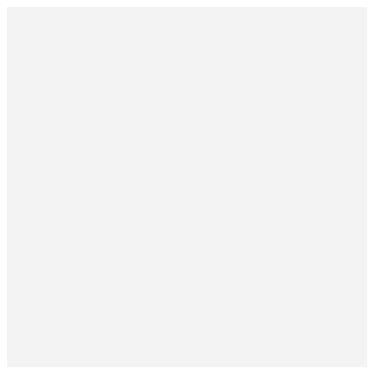

In [21]:
        import matplotlib.pyplot as plt
        from datetime import datetime
        import matplotlib
#         matplotlib.use('Agg')

        plt.rcParams["animation.html"] = "jshtml"
# m = max([c.fitness for c in maxes_config])
# for c in new_pop:
#     if c.fitness == m:
        great = copy.deepcopy(new_pop.members[0])
        x,y = Sb
        xc,yc = great.matrix.shape
        board = sg.Board(size=Sb)        
        board.add(Custom(great.matrix), loc=(x//2-xc//2,y//2-yc//2))        
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=great.L+5)
        anim = sim.animate()
        name = "P: "+str(int(great.P))+"\nL: "+str(great.L)+"\nI: "+str(great.I)
        path = r"C:\Users\mimis\Desktop\hish\animation"+name+".gif"
#         anim.save(path, writer='imagemagick', fps=30)
#         break

In [18]:
print(name)

P: 382
L: 3234
I: 10


In [23]:
anim

We can easily see that the configuration is stabalized long before it says so, but since this is a Torus, running Gliders are giving a hard time to the program, and they are being recognized as such only later and the Gliders keep affecting the configuration when coming back.

### Now,
we will present the growth of parameters

In [11]:
l_g = []
p_g = []
i_g = []
for c in maxes_config:
    l_g += [c.L]
    p_g += [c.P]
    i_g += [c.I]


<Figure size 864x432 with 0 Axes>

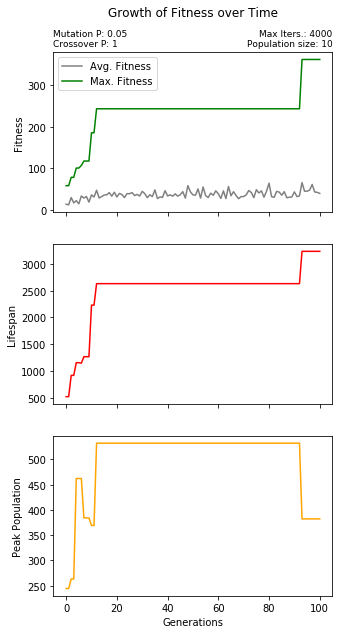

In [12]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

f, axs = plt.subplots(3, 1, sharex = True, sharey = False)
f.set_size_inches(5, 10)

axs[0].plot(fit_rise, c="gray", label="Avg. Fitness")
axs[1].plot(l_g, c="red", label="Lifespan")
axs[2].plot(p_g, c="orange", label="Peak")
axs[0].plot(fit_max_rise, c="green", label = "Max. Fitness")
axs[0].set_title("Growth of Fitness over Time\n\n")
axs[0].set_title("Max Iters.: "+str(In)+"\nPopulation size: "+str(len(new_pop.members)),loc="right",fontdict = {'fontsize': 9})
axs[0].set_title("Mutation P: "+str(Pm)+"\nCrossover P: "+str(Pr),loc="left",fontdict = {'fontsize': 9})

axs[2].set_xlabel("Generations")
axs[0].set_ylabel("Fitness")
axs[1].set_ylabel("Lifespan")
axs[2].set_ylabel("Peak Population")
axs[0].legend()
plt.show()
